<a href="https://colab.research.google.com/github/Rahman17309/ASSIGNMENT1/blob/main/EDA_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***`EDA 2`***

# Objective:
This assignment aims to equip you with practical skills in data preprocessing, feature engineering, and feature selection techniques, which are crucial for building efficient machine learning models. You will work with a provided dataset to apply various techniques such as scaling, encoding, and feature selection methods including isolation forest and PPS score analysis.

#Dataset:
Given "Adult" dataset, which predicts whether income exceeds $50K/yr based on census data.


# Tasks:
**1. Data Exploration and Preprocessing:**

•	Load the dataset and conduct basic data exploration (summary statistics, missing values, data types).

•	Handle missing values as per the best practices (imputation, removal, etc.).

•	Apply scaling techniques to numerical features:

•	Standard Scaling

•	Min-Max Scaling

•	Discuss the scenarios where each scaling technique is preferred and why.

**2. Encoding Techniques:**

•	Apply One-Hot Encoding to categorical variables with less than 5 categories.

•	Use Label Encoding for categorical variables with more than 5 categories.

•	Discuss the pros and cons of One-Hot Encoding and Label Encoding.

**3. Feature Engineering:**

•	Create at least 2 new features that could be beneficial for the model. Explain the rationale behind your choices.

•	Apply a transformation (e.g., log transformation) to at least one skewed numerical feature and justify your choice.

**4. Feature Selection:**

•	Use the Isolation Forest algorithm to identify and remove outliers. Discuss how outliers can affect model performance.

•	Apply the PPS (Predictive Power Score) to find and discuss the relationships between features. Compare its findings with the correlation matrix.


# Data Exploration and Preprocessing:

Import necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

Load the dataset

In [2]:
df = pd.read_csv('/content/adult_with_headers.csv')

Display basic information about the dataset

In [3]:
print("Dataset Information:")
df.info()

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education_num   32561 non-null  int64 
 5   marital_status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital_gain    32561 non-null  int64 
 11  capital_loss    32561 non-null  int64 
 12  hours_per_week  32561 non-null  int64 
 13  native_country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


unique values

In [4]:
unique_values = df.nunique()
print("Number of unique values in each column:")
print(unique_values)

Number of unique values in each column:
age                  73
workclass             9
fnlwgt            21648
education            16
education_num        16
marital_status        7
occupation           15
relationship          6
race                  5
sex                   2
capital_gain        119
capital_loss         92
hours_per_week       94
native_country       42
income                2
dtype: int64


Summary statistics

In [5]:
print("\nSummary Statistics:")
df.describe()


Summary Statistics:


,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


Check for missing values

In [6]:
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capital_gain      0
capital_loss      0
hours_per_week    0
native_country    0
income            0
dtype: int64


No missing values are found, If any found we can replace with mean, medain or we can remove

In [7]:
# Imputation - Replace missing values with mean
#df.fillna(df.mean(), inplace=True)

# Or Imputation - Replace missing values with median
# df.fillna(df.median(), inplace=True)

# Or Removal - Drop rows with missing values
# df.dropna(inplace=True)

Check data types

In [8]:
print("\nData Types:")
print(df.dtypes)


Data Types:
age                int64
workclass         object
fnlwgt             int64
education         object
education_num      int64
marital_status    object
occupation        object
relationship      object
race              object
sex               object
capital_gain       int64
capital_loss       int64
hours_per_week     int64
native_country    object
income            object
dtype: object


Check for duplicate values

In [9]:
print("\nDuplicate Values:")
print(df.duplicated().sum())


Duplicate Values:
24


View duplicate values


In [10]:
df[df.duplicated()]

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
4881,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico,<=50K
5104,90,Private,52386,Some-college,10,Never-married,Other-service,Not-in-family,Asian-Pac-Islander,Male,0,0,35,United-States,<=50K
9171,21,Private,250051,Some-college,10,Never-married,Prof-specialty,Own-child,White,Female,0,0,10,United-States,<=50K
11631,20,Private,107658,Some-college,10,Never-married,Tech-support,Not-in-family,White,Female,0,0,10,United-States,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
15059,21,Private,243368,Preschool,1,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,50,Mexico,<=50K
17040,46,Private,173243,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,<=50K
18555,30,Private,144593,HS-grad,9,Never-married,Other-service,Not-in-family,Black,Male,0,0,40,?,<=50K
18698,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States,<=50K
21318,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States,<=50K


Remove Duplicate values

In [11]:
df = df.drop_duplicates()

In [12]:
print("\nDuplicate Values:")
print(df.duplicated().sum())


Duplicate Values:
0


No Duplicat Values are found

Apply Scaling Techniques to Numerical Features:

In [13]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

Select numerical features for scaling

In [14]:
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns

Standard Scaling

In [15]:
scaler_standard = StandardScaler()
df[numerical_features] = scaler_standard.fit_transform(df[numerical_features])

Min-Max Scaling

In [16]:
scaler_minmax = MinMaxScaler()
df[numerical_features] = scaler_minmax.fit_transform(df[numerical_features])

### *•	Discuss the scenarios where each scaling technique is preferred and why.*

Discussion of scenarios where each scaling technique is preferred:

***Standard Scaling:***

**Scenario:**

Standard scaling (or Z-score normalization) is preferred when the distribution of the features is Gaussian-like (or approximately normally distributed).

**Reason:**

It centers the data around 0 with a standard deviation of 1, which makes it suitable for algorithms that assume zero-centered data, such as linear regression, logistic regression, and neural networks. It preserves the shape of the original distribution but standardizes the range of values.

***Min-Max Scaling:***

**Scenario:**

Min-max scaling is preferred when the distribution of the features is not Gaussian-like and the algorithm does not assume zero-centered data.

**Reason:**

It scales the data to a fixed range (usually 0 to 1), making it suitable for algorithms that require input features to be on the same scale, such as support vector machines (SVM), k-nearest neighbors (KNN), and neural networks with activation functions sensitive to scale, like sigmoid or tanh. Min-max scaling preserves the relative relationships between data points.

In summary, standard scaling is suitable for algorithms that assume zero-centered data and when the distribution is approximately Gaussian-like, while min-max scaling is more appropriate when the algorithm doesn't have such assumptions and requires input features to be within a specific range.

# Encoding Techniques:

•	Apply One-Hot Encoding to categorical variables with less than 5 categories

One-Hot Encoding for Columns with Less than 5 Categories:

In [18]:
from sklearn.preprocessing import OneHotEncoder

# Initialize one-hot encoder without 'sparse' parameter
one_hot_encoder = OneHotEncoder(drop='first', handle_unknown='ignore') # sparse=False is removed and handle_unknown='ignore' is added

# Identify categorical columns with less than 5 categories
categorical_columns = df.select_dtypes(include=['object']).columns
columns_to_encode = [col for col in categorical_columns if df[col].nunique() < 5]

# Apply one-hot encoding to selected columns
for col in columns_to_encode:
    print(f"One-hot encoding column: {col}")
    encoded_features = one_hot_encoder.fit_transform(df[[col]]).toarray() # toarray() is added here to convert the sparse matrix to a dense array
    # Update column names with encoded feature names
    encoded_feature_names = [f"{col}_{cat}" for cat in one_hot_encoder.categories_[0][1:]]
    encoded_df = pd.DataFrame(encoded_features, columns=encoded_feature_names, index=df.index) # index=df.index is added to align the index
    # Drop original categorical column and concatenate encoded features
    df = df.drop(columns=[col])
    df = pd.concat([df, encoded_df], axis=1)

df.head()

One-hot encoding column: sex
One-hot encoding column: income


,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,capital_gain,capital_loss,hours_per_week,native_country,sex_ Male,income_ >50K
0,0.301370,State-gov,0.044302,Bachelors,0.800000,Never-married,Adm-clerical,Not-in-family,White,0.02174,0.0,0.397959,United-States,1.0,0.0
1,0.452055,Self-emp-not-inc,0.048238,Bachelors,0.800000,Married-civ-spouse,Exec-managerial,Husband,White,0.00000,0.0,0.122449,United-States,1.0,0.0
2,0.287671,Private,0.138113,HS-grad,0.533333,Divorced,Handlers-cleaners,Not-in-family,White,0.00000,0.0,0.397959,United-States,1.0,0.0
3,0.493151,Private,0.151068,11th,0.400000,Married-civ-spouse,Handlers-cleaners,Husband,Black,0.00000,0.0,0.397959,United-States,1.0,0.0
4,0.150685,Private,0.221488,Bachelors,0.800000,Married-civ-spouse,Prof-specialty,Wife,Black,0.00000,0.0,0.397959,Cuba,0.0,0.0


•	Use Label Encoding for categorical variables with more than 5 categories.

Label Encoding for Columns with More than 5 Categories:

In [19]:
from sklearn.preprocessing import LabelEncoder

# Initialize label encoder
label_encoder = LabelEncoder()

# Identify categorical columns with more than 5 categories
categorical_columns = df.select_dtypes(include=['object']).columns
columns_to_encode = [col for col in categorical_columns if df[col].nunique() >= 5]

# Apply label encoding to selected columns
for col in columns_to_encode:
    print(f"Label encoding column: {col}")
    df[col] = label_encoder.fit_transform(df[col])

df.head()

Label encoding column: workclass
Label encoding column: education
Label encoding column: marital_status
Label encoding column: occupation
Label encoding column: relationship
Label encoding column: race
Label encoding column: native_country


,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,capital_gain,capital_loss,hours_per_week,native_country,sex_ Male,income_ >50K
0,0.301370,7,0.044302,9,0.800000,4,1,1,4,0.02174,0.0,0.397959,39,1.0,0.0
1,0.452055,6,0.048238,9,0.800000,2,4,0,4,0.00000,0.0,0.122449,39,1.0,0.0
2,0.287671,4,0.138113,11,0.533333,0,6,1,4,0.00000,0.0,0.397959,39,1.0,0.0
3,0.493151,4,0.151068,1,0.400000,2,6,0,2,0.00000,0.0,0.397959,39,1.0,0.0
4,0.150685,4,0.221488,9,0.800000,2,10,5,2,0.00000,0.0,0.397959,5,0.0,0.0


# Discussion of the pros and cons of One-Hot Encoding and Label Encoding:



**One-Hot Encoding:**

***Pros:***

Preserves Distinct Categories: One-hot encoding represents each category in a separate binary column, preserving the distinction between categories.
Suitable for Categorical Variables with Few Categories: It is suitable for categorical variables with a small number of unique categories.
Works well with Most Machine Learning Algorithms: One-hot encoding is compatible with most machine learning algorithms and does not impose assumptions about the relationship between categories.

***Cons:***

Increases Dimensionality: One-hot encoding increases the dimensionality of the dataset, especially when dealing with categorical variables with many unique categories, which can lead to the curse of dimensionality.
Sparse Representation: In datasets with many unique categories, the resulting one-hot encoded matrix can become sparse, consuming more memory and computational resources.
Introduces Multicollinearity: One-hot encoding introduces multicollinearity, as one category becomes perfectly predictable from the others. This can lead to issues in some algorithms like linear regression.

**Label Encoding:**

***Pros:***

Reduces Dimensionality: Label encoding reduces the dimensionality of the dataset by encoding categorical variables with integer labels, which can be beneficial for algorithms that struggle with high-dimensional data.
Preserves Order in Ordinal Variables: Label encoding preserves the ordinal relationship between categories if present in the data, which can be useful for certain algorithms.
Simpler Representation: The resulting encoded data is more compact compared to one-hot encoding, which can save memory and computational resources.

***Cons:***

Assumes Ordinal Relationship: Label encoding assumes an ordinal relationship between categories, which may not always be present or may not be correctly inferred by the algorithm.
May Introduce Unintended Order: Label encoding may introduce unintended ordinal relationships between categories, especially if the algorithm misinterprets the encoded integer labels as meaningful ordinal values.
Not Suitable for Nominal Variables: Label encoding is not suitable for categorical variables without an inherent order, as it may introduce spurious relationships between categories.


Overall, the choice between one-hot encoding and label encoding depends on the nature of the categorical variable, the specific requirements of the machine learning algorithm, and the potential trade-offs between dimensionality, interpretability, and computational efficiency.

# Feature Engineering:

•	Create at least 2 new features that could be beneficial for the model. Explain the rationale behind your choices.

##Two new features that could be beneficial for the model, along with the rationale behind each choice:

##Income per Hour:
**Rationale:**

Calculating the income per hour can provide a normalized measure of an individual's earning efficiency, regardless of the number of hours worked. It helps capture the value generated per unit of time, which could be more informative than the absolute income or hours worked alone.

**Formula:** Income per Hour = (Income - Capital Loss) / Hours per Week

**Benefit:** This feature can help the model differentiate between individuals who earn higher incomes due to working longer hours versus those who earn higher incomes due to higher earning efficiency within a given timeframe.

##Total Capital Gain and Loss:

**Rationale:**
Combining capital gain and loss into a single feature can provide a holistic view of an individual's financial transactions and their net impact. It simplifies the representation of financial gains and losses, making it easier for the model to capture the overall financial behavior of individuals.

**Formula:** Total Capital Gain and Loss = Capital Gain - Capital Loss

**Benefit:** This feature captures the net financial gain or loss experienced by an individual, providing valuable information about their financial situation and investment behavior. It can help the model identify individuals with significant financial gains or losses, which may be indicative of their overall financial stability or risk-taking behavior.

Create a new feature: Income per Hour

In [20]:
df['income_per_hour'] = (df['income_ >50K'] - df['capital_loss']) / df['hours_per_week']

Create a new feature: Total Capital Gain and Loss

In [21]:
df['total_capital_gain_loss'] = df['capital_gain'] - df['capital_loss']

In [22]:
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,capital_gain,capital_loss,hours_per_week,native_country,sex_ Male,income_ >50K,income_per_hour,total_capital_gain_loss
0,0.301370,7,0.044302,9,0.800000,4,1,1,4,0.02174,0.0,0.397959,39,1.0,0.0,0.0,0.02174
1,0.452055,6,0.048238,9,0.800000,2,4,0,4,0.00000,0.0,0.122449,39,1.0,0.0,0.0,0.00000
2,0.287671,4,0.138113,11,0.533333,0,6,1,4,0.00000,0.0,0.397959,39,1.0,0.0,0.0,0.00000
3,0.493151,4,0.151068,1,0.400000,2,6,0,2,0.00000,0.0,0.397959,39,1.0,0.0,0.0,0.00000
4,0.150685,4,0.221488,9,0.800000,2,10,5,2,0.00000,0.0,0.397959,5,0.0,0.0,0.0,0.00000


•	Apply a transformation (e.g., log transformation) to at least one skewed numerical feature and justify your choice.

Check the skewness before transformation

In [23]:
from scipy.stats import skew

# Select numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Calculate skewness for each numerical column
skewness = df[numerical_columns].apply(lambda x: skew(x.dropna()))

# Filter columns with right skewness (skewness > 0)
right_skewed_columns = skewness[skewness > 0].index

# Display columns with right skewness and their skewness values
for col in right_skewed_columns:
    print(f"Column '{col}' has skewness of {skewness[col]} (right skew)")


Column 'age' has skewness of 0.5576374421375199 (right skew)
Column 'fnlwgt' has skewness of 1.447636166419673 (right skew)
Column 'occupation' has skewness of 0.11458060331277602 (right skew)
Column 'relationship' has skewness of 0.7865121051026421 (right skew)
Column 'capital_gain' has skewness of 11.948851942756665 (right skew)
Column 'capital_loss' has skewness of 4.592490690725554 (right skew)
Column 'hours_per_week' has skewness of 0.2287483316217172 (right skew)
Column 'income_ >50K' has skewness of 1.211631582839416 (right skew)
Column 'total_capital_gain_loss' has skewness of 0.7115255674129186 (right skew)


/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:127: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Based on the skewness values obtained, the 'capital_gain' feature has the highest skewness of approximately 11.95, indicating significant right skewness. This suggests that applying a transformation, such as a log transformation, to the 'capital_gain' feature would likely be the most suitable choice.

In [24]:
import plotly.express as px

# Calculate skewness for each numerical column
skewness = df[numerical_columns].apply(lambda x: skew(x.dropna()))

# Filter columns with right skewness (skewness > 0)
right_skewed_columns = skewness[skewness > 0].index

# Create a DataFrame for plotting
skewness_df = pd.DataFrame({'Column': right_skewed_columns, 'Skewness': skewness[right_skewed_columns]})

# Create an interactive bar plot
fig = px.bar(skewness_df, x='Column', y='Skewness',
             title='Skewness of Numerical Columns (Right Skewed)',
             labels={'Skewness': 'Skewness'},
             color='Skewness',
             color_continuous_scale='RdYlBu')

# Update layout for better visualization
fig.update_layout(xaxis_title='Column', yaxis_title='Skewness',
                  coloraxis_colorbar=dict(title='Skewness'))

fig.show()

In [25]:
original_skewness = df['capital_gain'].skew()
print("Original Skewness of 'capital_gain':", original_skewness)

Original Skewness of 'capital_gain': 11.94940283355146


Apply log transformation to 'capital_gain'

In [26]:
df['capital_gain_log'] = np.log1p(df['capital_gain'])

Check the skewness of 'capital_gain' after transformation

In [27]:
transformed_skewness = df['capital_gain_log'].skew()
print("Skewness of 'capital_gain' after Log Transformation:", transformed_skewness)

Skewness of 'capital_gain' after Log Transformation: 10.667468268772069


After applying a log transformation to 'capital_gain', the skewness reduces to approximately 10.67.

##Justification for Log Transformation:

Log transformation is effective for reducing skewness in highly skewed distributions like financial data.

It preserves relative differences between lower values while compressing larger values, making it suitable for financial data analysis.

Log transformation helps in normalizing the distribution, making the data more suitable for modeling techniques.

# Feature Selection:

•	Use the Isolation Forest algorithm to identify and remove outliers. Discuss how outliers can affect model performance.

Check for infinite or extremely large values

In [28]:
import plotly.express as px

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

fig = px.box(df, y=numerical_columns, title='Box plot of Numerical Columns')
fig.update_layout(xaxis_title='Column', yaxis_title='Value', yaxis=dict(type='linear'))
fig.show()

In [29]:
print("Number of infinite or extremely large values in the dataset:")
print(df[~np.isfinite(df).all(axis=1)].shape[0])

Number of infinite or extremely large values in the dataset:
20


Replace infinite or extremely large values with NaN

In [30]:
df.replace([np.inf, -np.inf], np.nan, inplace=True)

Remove rows containing NaN values

In [31]:
df.dropna(inplace=True)

Initialize the Isolation Forest model

In [32]:
from sklearn.ensemble import IsolationForest

In [33]:
iso_forest = IsolationForest(contamination=0.05, random_state=42)

Fit the model and predict outliers

In [34]:
outlier_preds = iso_forest.fit_predict(df)

Filter out non-outliers

In [35]:
df_no_outliers = df[outlier_preds == 1]

Display the shape of the dataset before and after removing outliers

In [36]:
print("Shape of dataset before removing outliers:", df.shape)
print("Shape of dataset after removing outliers:", df_no_outliers.shape)

Shape of dataset before removing outliers: (32517, 18)
Shape of dataset after removing outliers: (30891, 18)


Visualization of outliers before and after applying isolation forest

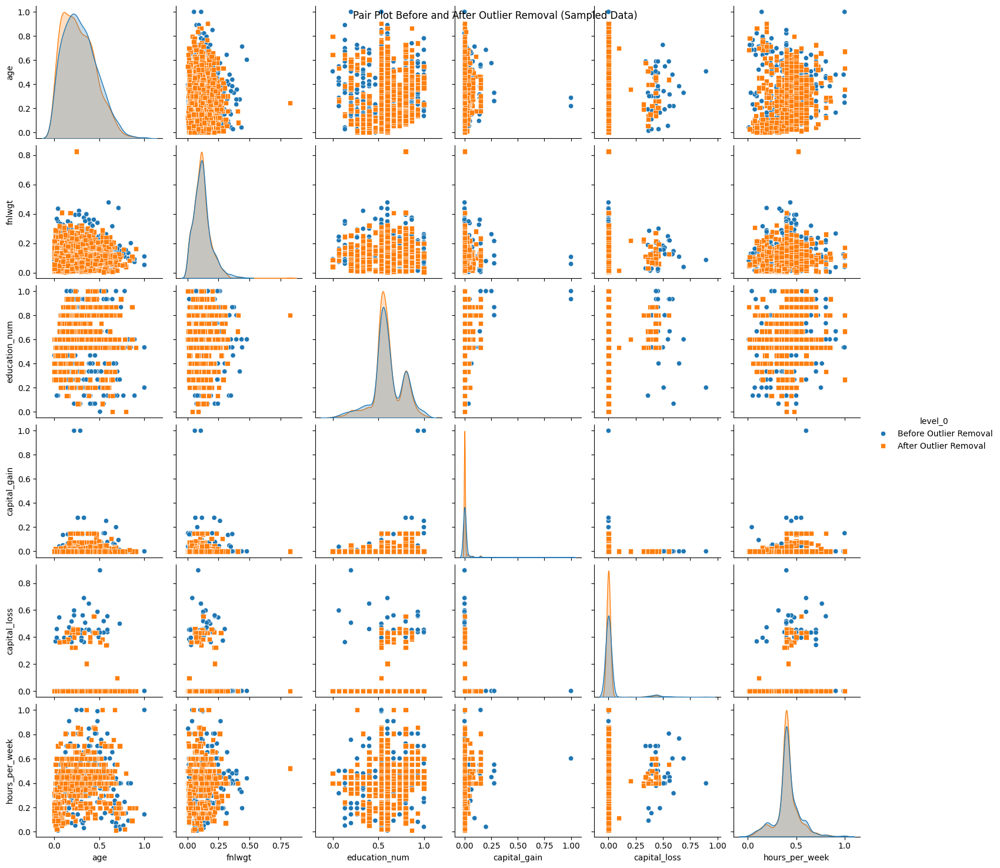

In [37]:
# Define numerical columns for visualization
numerical_columns = ['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss', 'hours_per_week']

# Sample a subset of the data
sample_size = 1000
df_sample = df.sample(sample_size, random_state=42)
df_no_outliers_sample = df_no_outliers.sample(sample_size, random_state=42)

# Concatenate the original DataFrame with the one without outliers
df_concat_sample = pd.concat([df_sample[numerical_columns], df_no_outliers_sample[numerical_columns]], keys=['Before Outlier Removal', 'After Outlier Removal'])

# Create pair plot
sns.pairplot(df_concat_sample.reset_index(level=0), hue='level_0', diag_kind='kde', markers=['o', 's'])
plt.suptitle('Pair Plot Before and After Outlier Removal (Sampled Data)')
plt.show()

# Discuss how outliers can affect model performance.

**Skewing Results:** Outliers can distort statistical measures like mean and standard deviation, leading to biased model predictions.

**Decreased Accuracy:** Outliers can introduce noise in the data, reducing the accuracy of the model's predictions.

**Model Instability:** Outliers can influence the model's decision boundaries, leading to unstable and unreliable predictions.

**Overfitting:** Models may overfit to outliers, capturing noise instead of the underlying patterns in the data, resulting in poor generalization to new data.

**Misleading Relationships:** Outliers can create misleading relationships between variables, leading to erroneous conclusions and model interpretations.

Overall, removing outliers is essential to ensure the reliability and accuracy of machine learning models.

•	Apply the PPS (Predictive Power Score) to find and discuss the relationships between features. Compare its findings with the correlation matrix.

Calculate the Predictive Power Score (PPS) matrix

In [38]:
!pip install ppscore

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 89.2 MB/s eta 0:00:00
  Created wheel for ppscore: filename=ppscore-1.3.0-py2.py3-none-any.whl size=13166 sha256=e8196337f40134427fcfa78f67a0af2c87bb905d20920954576975189778e232
  Stored in directory: /root/.cache/pip/wheels/7e/45/08/bb444e1bca6a2bc3795707de9edd87ec1976dd8b3570fa7abf
Successfully built ppscore
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
xarray 2025.1.2 requires pandas>=2.1, but you have pandas 1.5.3 which is incompatible.
mizani 0.13.2 requires pandas>=2.2.0, but you have pandas 1.5.3 which is incompatibl

In [40]:
import ppscore as pps
# Calculate the Predictive Power Score (PPS) matrix
pps_matrix = pps.matrix(df)

# Display the PPS matrix
print("Predictive Power Score (PPS) Matrix:")
print(pps_matrix)

Predictive Power Score (PPS) Matrix:
                    x                        y  ppscore            case  \
0                 age                      age      1.0  predict_itself   
1                 age                workclass      0.0      regression   
2                 age                   fnlwgt      0.0      regression   
3                 age                education      0.0      regression   
4                 age            education_num      0.0      regression   
..                ...                      ...      ...             ...   
319  capital_gain_log                sex_ Male      0.0      regression   
320  capital_gain_log             income_ >50K      0.0      regression   
321  capital_gain_log          income_per_hour      0.0      regression   
322  capital_gain_log  total_capital_gain_loss      0.0      regression   
323  capital_gain_log         capital_gain_log      1.0  predict_itself   

     is_valid_score               metric  baseline_score  mode

Reshape the PPS matrix values

In [41]:
num_rows = len(pps_matrix["x"].unique())
num_cols = len(pps_matrix["y"].unique())
pps_values_reshaped = pps_matrix.ppscore.values.reshape(num_rows, num_cols)

Create heatmap for the PPS matrix

In [42]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(z=pps_values_reshaped,
                                x=pps_matrix["y"].unique(),
                                y=pps_matrix["x"].unique(),
                                colorscale='Viridis'))

# Customize the layout
fig.update_layout(title='Predictive Power Score (PPS) Matrix',
                  xaxis_title='Features',
                  yaxis_title='Features')

# Show the interactive plot
fig.show()

Compare with the correlation matrix

In [43]:
correlation_matrix = df.corr()

# Display the correlation matrix
print("\nCorrelation Matrix:")
print(correlation_matrix)


Correlation Matrix:
                              age  workclass    fnlwgt  education  \
age                      1.000000   0.005657 -0.076510  -0.009937   
workclass                0.005657   1.000000 -0.016463   0.023103   
fnlwgt                  -0.076510  -0.016463  1.000000  -0.027932   
education               -0.009937   0.023103 -0.027932   1.000000   
education_num            0.036621   0.052090 -0.043332   0.358950   
marital_status          -0.266921  -0.064582  0.027932  -0.038582   
occupation              -0.019578   0.254015  0.001310  -0.021407   
relationship            -0.264104  -0.090129  0.008936  -0.011194   
race                     0.029104   0.049589 -0.021627   0.014159   
capital_gain             0.077908   0.033802  0.000401   0.030066   
capital_loss             0.057652   0.011873 -0.010130   0.016583   
hours_per_week           0.072151   0.137155 -0.019399   0.055557   
native_country          -0.000660  -0.008132 -0.051955   0.063381   
sex_ Male    

Visualize the correlation matrix

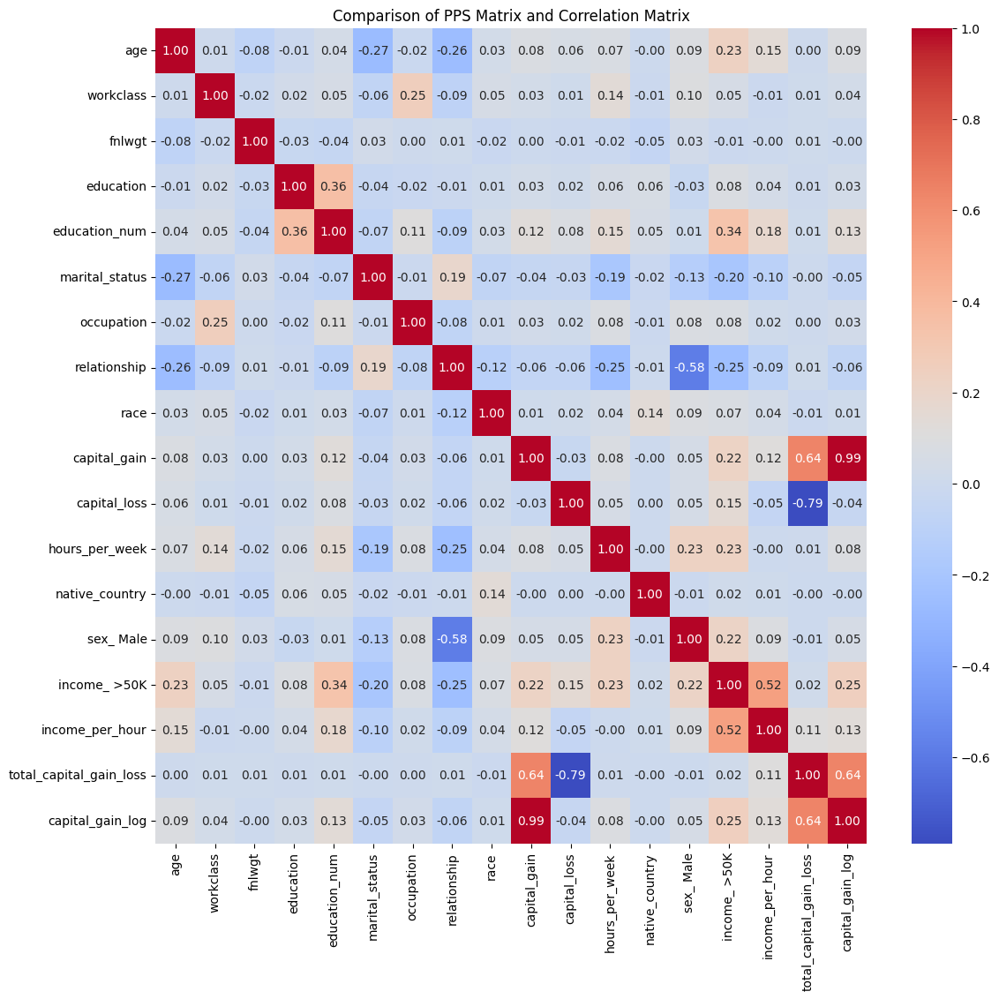

In [44]:
plt.figure(figsize=(13, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Comparison of PPS Matrix and Correlation Matrix')
plt.show()

#Based on the Predictive Power Score (PPS) matrix and the correlation matrix:

#PPS Matrix Insights:

The PPS matrix provides information about the predictive power of each feature with respect to others.

A PPS score of 1.0 indicates that the feature perfectly predicts itself (predict_itself case).

A PPS score of 0.0 suggests that there is no predictive power between the two features (regression case).

The PPS matrix also includes information about the model used and scores related to the model's performance.

#Correlation Matrix Insights:

The correlation matrix shows the linear relationship between pairs of features.

Correlation coefficients range from -1 to 1, where 1 indicates a perfect positive linear relationship, -1 indicates a perfect negative linear relationship, and 0 indicates no linear relationship.

However, correlation only measures linear relationships and may not capture non-linear associations.

#Comparison:

Both matrices provide valuable insights into the relationships between features, but they measure different aspects.

The PPS matrix captures non-linear relationships and provides additional information about predictive power beyond linear associations.

On the other hand, the correlation matrix only measures linear relationships and may overlook non-linear associations.

Comparing the two matrices can help identify discrepancies and provide a more comprehensive understanding of feature relationships.

Overall, by analyzing both the PPS matrix and the correlation matrix, we can gain a deeper understanding of the relationships between features and make more informed decisions in model building and feature selection.